# Customer Preference Analysis
- Analyze the relationship between the type of cuisine and the restaurant's rating.
- Identify the most popular cuisines among customers based on the number of votes.
- Determine if there are any specific cuisines that tend to receive higher ratings.

### Task1 : Data Exploration and preprocessing
- Exploring the dataset
- Shape of the dataset
- checking for missing values
- Data Type conversion


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df=pd.read_csv(r"C:\Users\Lenovo\Downloads\Dataset (1).csv")
df.head(3)

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270


In [3]:
#Dropping columns that have low variance
df.drop(labels=['Locality', 'Locality Verbose', 'Currency','Address','Longitude','Latitude'], axis=1, inplace=True)

In [4]:
df.head(3)

,Restaurant ID,Restaurant Name,Country Code,City,Cuisines,Average Cost for two,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"French, Japanese, Desserts",1100,Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,Japanese,1200,Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Seafood, Asian, Filipino, Indian",4000,Yes,No,No,No,4,4.4,Green,Very Good,270


In [5]:
print("The shape of the data is:",df.shape)
print("Dupicalted values: ", df.duplicated().sum())

The shape of the data is: (9551, 15)
Dupicalted values:  0


In [6]:
df.isnull().sum()
df.dropna(inplace=True)
print("Data Shape after dropping null values:",df.shape)

Data Shape after dropping null values: (9542, 15)


In [7]:
df['Country Code'].value_counts()

1      8652
216     425
215      80
30       60
214      60
189      60
148      40
208      34
14       24
162      22
94       21
184      20
166      20
191      20
37        4
Name: Country Code, dtype: int64

In [8]:
df['City'].value_counts()

New Delhi         5473
Gurgaon           1118
Noida             1080
Faridabad          251
Ghaziabad           25
                  ... 
Lincoln              1
Lakeview             1
Lakes Entrance       1
Inverloch            1
Panchkula            1
Name: City, Length: 140, dtype: int64

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9542 entries, 0 to 9550
Data columns (total 15 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Restaurant ID         9542 non-null   int64  
 1   Restaurant Name       9542 non-null   object 
 2   Country Code          9542 non-null   int64  
 3   City                  9542 non-null   object 
 4   Cuisines              9542 non-null   object 
 5   Average Cost for two  9542 non-null   int64  
 6   Has Table booking     9542 non-null   object 
 7   Has Online delivery   9542 non-null   object 
 8   Is delivering now     9542 non-null   object 
 9   Switch to order menu  9542 non-null   object 
 10  Price range           9542 non-null   int64  
 11  Aggregate rating      9542 non-null   float64
 12  Rating color          9542 non-null   object 
 13  Rating text           9542 non-null   object 
 14  Votes                 9542 non-null   int64  
dtypes: float64(1), int64(

> Analyze the distribution of the target variable
("Aggregate rating") and identify any class
imbalances.

In [10]:
df['Aggregate rating'].value_counts()

0.0    2148
3.2     522
3.1     519
3.4     495
3.3     483
3.5     480
3.0     468
3.6     458
3.7     427
3.8     399
2.9     381
3.9     332
2.8     315
4.1     274
4.0     266
2.7     250
4.2     221
2.6     191
4.3     174
4.4     143
2.5     110
4.5      95
2.4      87
4.6      78
4.9      61
2.3      47
4.7      41
2.2      27
4.8      25
2.1      15
2.0       7
1.9       2
1.8       1
Name: Aggregate rating, dtype: int64

- The majority of ratings are concentrated in the lower range i.e 0.0,between 2.6 and 3.9.
-  Higher ratings (above 4.0) have fewer occurrences, indicating a potential class imbalance towards lower ratings.

### Task 2 : Descriptive Analysis
- Calculating Statistical measures 
- Exploring distribution of categorical variables
- Identifying Top cuisines and cities with the highest number of restraunts

In [11]:
#Calculating Statistical measures
df.describe()

,Restaurant ID,Country Code,Average Cost for two,Price range,Aggregate rating,Votes
count,9.542000e+03,9542.000000,9542.000000,9542.000000,9542.000000,9542.000000
mean,9.043301e+06,18.179208,1200.326137,1.804968,2.665238,156.772060
std,8.791967e+06,56.451600,16128.743876,0.905563,1.516588,430.203324
min,5.300000e+01,1.000000,0.000000,1.000000,0.000000,0.000000
25%,3.019312e+05,1.000000,250.000000,1.000000,2.500000,5.000000
50%,6.002726e+06,1.000000,400.000000,2.000000,3.200000,31.000000
75%,1.835260e+07,1.000000,700.000000,2.000000,3.700000,130.000000
max,1.850065e+07,216.000000,800000.000000,4.000000,4.900000,10934.000000


keytake aways from this
- Average Cost for Two: The average cost for two people dining at these restaurants is approximately 1,199.21 monetary units.

- Price Range: The price range of the restaurants is classified on a scale from 1 to 4. The mean price range is 1.80, indicating that most restaurants fall within the lower price range.

- Aggregate Rating: The average rating for the restaurants is 2.67, based on the provided aggregate rating system.

- Votes: The restaurants in the dataset have received an average of 156.91 votes. The minimum number of votes is 0, while the maximum is 10,934. The standard deviation of votes is relatively high, indicating varying levels of popularity among the restaurants.

- Minimum and Maximum Values: The minimum average cost for two people dining at a restaurant is 0, suggesting the possibility of free or extremely low-cost establishments. The maximum average cost is 800,000, which seems unusually high and might be an outlier. Similarly, the maximum number of votes is 10,934, which could also be an outlier.

> ### Mapping Countries

In [12]:
country_codes={
    1:'India',
    216:'United States',
    215:'United Kingdom',
    214:'UAE',
    189:'South Africa',
    30:'Brazil',
    148:'New Zeland',
    208:'Turkey',
    14:'Austrialia',
    162:'Philippines',
    94:'Indonesia',
    191:'Sri Lanka',
    184:'Singapore',
    166:'Qatar',
    37:'Canada'
}
df['Country_name']=df['Country Code'].map(country_codes)

In [13]:
grouped_cuisine = df.groupby('Cuisines')['Votes'].agg(['mean', 'median', 'count']).sort_values(by='mean', ascending=False)
grouped_cuisine

,mean,median,count
Cuisines,,,
"Italian, American, Pizza",10934.000000,10934.0,1
"American, Burger, Cafe",9667.000000,9667.0,1
"Finger Food, North Indian, Italian, Continental, Thai, South Indian",5705.000000,5705.0,1
"American, Continental, Italian, North Indian, Asian",4914.000000,4914.0,1
"European, Mediterranean, North Indian",4180.333333,5434.0,3
...,...,...,...
"Cafe, Tibetan",0.000000,0.0,1
"South Indian, Chinese, Mughlai",0.000000,0.0,1
"South Indian, Chinese, Mithai",0.000000,0.0,1


In [14]:
grouped_pricing = df.groupby('Price range')['Votes'].agg(['mean', 'median', 'count']).sort_values(by='mean', ascending=False)
grouped_pricing

,mean,median,count
Price range,,,
3,443.762989,199.0,1405
4,368.595563,171.5,586
2,147.607131,51.0,3113
1,44.374493,8.0,4438


- Price range 1 has the lowest mean votes, with an average of approximately 44.37 votes. The median is 8 votes. However, it has the highest count, indicating that there are 4,438 restaurants in this price range.
- These insights suggest that there may be a relationship between price range and the number of votes received. 
- Higher-priced restaurants (price range 3 and 4) tend to have higher mean votes compared to lower-priced restaurants (price range 1 and 2). 

In [15]:
grouped_location = df.groupby('Country_name')['Votes'].agg(['mean', 'median', 'count']).sort_values(by='mean',ascending=False)
grouped_location

,mean,median,count
Country_name,,,
Indonesia,772.095238,605.0,21
UAE,493.516667,356.0,60
Turkey,431.470588,182.0,34
United States,430.875294,271.0,425
Philippines,407.409091,378.5,22
South Africa,315.166667,253.0,60
New Zeland,243.025000,168.0,40
United Kingdom,205.487500,105.5,80
Qatar,163.800000,150.0,20


In [16]:
grouped_by_city=df.groupby('City')['Votes'].agg(['mean','median','count']).sort_values(by='count',ascending=False)
grouped_by_city

,mean,median,count
City,,,
New Delhi,114.807236,21.0,5473
Gurgaon,118.211091,27.0,1118
Noida,68.044444,10.5,1080
Faridabad,25.840637,7.0,251
Ghaziabad,94.640000,60.0,25
...,...,...,...
Randburg,618.000000,618.0,1
Macedon,31.000000,31.0,1
Lorn,18.000000,18.0,1


In [17]:
grouped_rating_text=df.groupby('Rating color')['Votes'].agg(['mean','median','count']).sort_values(by='mean',ascending=False)
grouped_rating_text

,mean,median,count
Rating color,,,
Dark Green,852.253333,488.5,300
Green,519.867347,271.0,1078
Yellow,229.416985,120.5,2096
Red,90.715054,61.0,186
Orange,48.266202,20.0,3734
White,0.870112,0.0,2148


In [18]:
df['Country_name'].value_counts()

India             8652
United States      425
United Kingdom      80
Brazil              60
UAE                 60
South Africa        60
New Zeland          40
Turkey              34
Austrialia          24
Philippines         22
Indonesia           21
Singapore           20
Qatar               20
Sri Lanka           20
Canada               4
Name: Country_name, dtype: int64

> ### Finding Relation between categorical variables

In [19]:
#contigency table
contigency_table=pd.crosstab(df['Country_name'],df['Has Online delivery'],margins=False)
sorted_table = contigency_table.sort_values(by='Yes', ascending=False)
sorted_table

Has Online delivery,No,Yes
Country_name,,
India,6229,2423
UAE,32,28
Austrialia,24,0
Brazil,60,0
Canada,4,0
Indonesia,21,0
New Zeland,40,0
Philippines,22,0
Qatar,20,0


- The data shows alot of variation as most of the data covers india not other countries which create variation between countries.
- India has the highest Online delivery presences which indicates a strong online delivery presence compared to other countries.
- The United States has the highest overall number of entries (434) in the dataset, indicating a larger sample size for analysis compared to other countries.
- Overall, the dataset suggests a variation in online delivery availability among the listed countries, with India being the most prominent country with a high number of online delivery options.

In [20]:
df.columns

Index(['Restaurant ID', 'Restaurant Name', 'Country Code', 'City', 'Cuisines',
       'Average Cost for two', 'Has Table booking', 'Has Online delivery',
       'Is delivering now', 'Switch to order menu', 'Price range',
       'Aggregate rating', 'Rating color', 'Rating text', 'Votes',
       'Country_name'],
      dtype='object')

In [21]:
table_booking=pd.crosstab(df['Country_name'],df['Has Table booking'],margins=True)
table_booking

Has Table booking,No,Yes,All
Country_name,,,
Austrialia,24,0,24
Brazil,60,0,60
Canada,4,0,4
India,7541,1111,8652
Indonesia,21,0,21
New Zeland,40,0,40
Philippines,8,14,22
Qatar,19,1,20
Singapore,20,0,20


In [22]:
average_rating = pd.crosstab(df['Country_name'],df['Rating color'],margins=True)
average_rating

Rating color,Dark Green,Green,Orange,Red,White,Yellow,All
Country_name,,,,,,,
Austrialia,1,5,4,1,0,13,24
Brazil,16,20,8,0,5,11,60
Canada,0,1,2,0,0,1,4
India,116,692,3678,180,2139,1847,8652
Indonesia,7,10,1,0,0,3,21
New Zeland,12,25,0,1,0,2,40
Philippines,12,9,0,0,0,1,22
Qatar,4,7,2,0,0,7,20
Singapore,0,3,9,0,0,8,20


- India has the highest count of restaurants falling under different rating colors, with a substantial number in each category. The highest counts for India are observed in the "Orange" (3,678) and "Yellow" (1,847) rating colors, followed by "Dark Green" (116), "Green" (692), and "Red" (180).

- The United States also has a substantial count of restaurants in each rating color, with the highest counts in the "Green" (178), "White" (2148), and "Yellow" (155) categories.

In [23]:
votes= pd.crosstab(df['Country_name'],df['Rating text'],margins=True)
votes

Rating text,Average,Excellent,Good,Not rated,Poor,Very Good,All
Country_name,,,,,,,
Austrialia,4,1,13,0,1,5,24
Brazil,8,16,11,5,0,20,60
Canada,2,0,1,0,0,1,4
India,3678,116,1847,2139,180,692,8652
Indonesia,1,7,3,0,0,10,21
New Zeland,0,12,2,0,1,25,40
Philippines,0,12,1,0,0,9,22
Qatar,2,4,7,0,0,7,20
Singapore,9,0,8,0,0,3,20


- The majority of restaurants across all countries are labeled as "Not rated". This is evident from the high count of "Not rated" in the respective column for each country.

- India has the highest count of restaurants with "Average" ratings, with 3,678 restaurants falling under this category. India also has a significant number of restaurants labeled as "Very Good" (692) and "Good" (1,847).

- The United States has a high count of restaurants labeled as "Excellent" (67), "Very Good" (178), and "Good" (155).

In [24]:
pivot1=df.pivot_table(index='Country_name',values='Votes').sort_values(by='Votes',ascending=False)

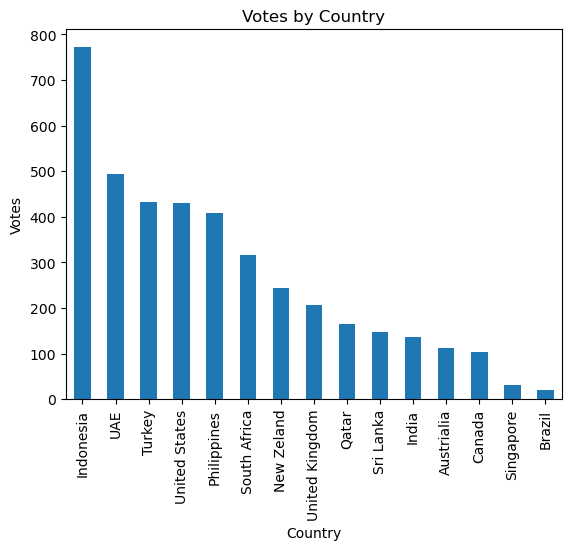

In [25]:
pivot1.plot(kind='bar', legend=False)
plt.xlabel('Country')
plt.ylabel('Votes')
plt.title('Votes by Country')
plt.show()

In [26]:
df.pivot_table(index='Cuisines',values='Votes').sort_values(by='Votes',ascending=False)

,Votes
Cuisines,
"Italian, American, Pizza",10934.000000
"American, Burger, Cafe",9667.000000
"Finger Food, North Indian, Italian, Continental, Thai, South Indian",5705.000000
"American, Continental, Italian, North Indian, Asian",4914.000000
"European, Mediterranean, North Indian",4180.333333
...,...
"Cafe, Tibetan",0.000000
"South Indian, Chinese, Mughlai",0.000000
"South Indian, Chinese, Mithai",0.000000


<AxesSubplot: >

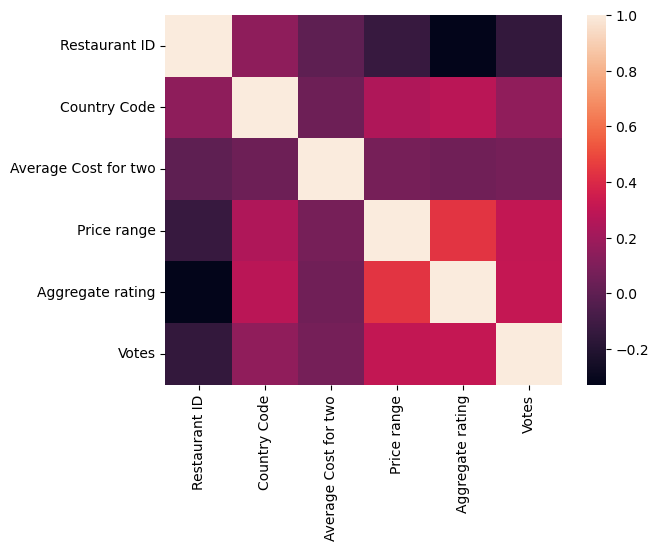

In [27]:
sns.heatmap(df.corr(), fmt='.2g')

In [28]:
correlation_table = df.corr()
correlation_table

,Restaurant ID,Country Code,Average Cost for two,Price range,Aggregate rating,Votes
Restaurant ID,1.000000,0.146270,-0.001629,-0.134528,-0.327160,-0.147434
Country Code,0.146270,1.000000,0.043717,0.245363,0.281295,0.154361
Average Cost for two,-0.001629,0.043717,1.000000,0.075111,0.051864,0.067833
Price range,-0.134528,0.245363,0.075111,1.000000,0.438356,0.309474
Aggregate rating,-0.327160,0.281295,0.051864,0.438356,1.000000,0.313474
Votes,-0.147434,0.154361,0.067833,0.309474,0.313474,1.000000


### Insights 
- Price range exhibits a moderate positive correlation with Aggregate rating (0.437944) and Votes (0.309444), suggesting that restaurants with higher price ranges tend to have higher ratings and receive more votes.
- Aggregate rating shows a moderate positive correlation with Price range (0.437944) and Votes (0.313691). This implies that higher-rated restaurants tend to have higher price ranges and attract more votes.
- Votes have a moderate positive correlation with Price range (0.309444) and a weak positive correlation with Country Code (0.154530). This suggests that restaurants with higher votes tend to have higher price ranges and may be influenced by the country in which they are located.










### Task 3 :GeoSpatial Analysis
- Visualizing the location of restraunts on a map using longitude and latitude 
- Analyzing the distribution of restraunts across different cities and countries
- Finding correlation between restraunt location and its rating

In [29]:
new_df=pd.read_csv(r"C:\Users\Lenovo\Downloads\Dataset (1).csv")
new_df.head(2)

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591


In [30]:
country_codes={
    1:'India',
    216:'United States',
    215:'United Kingdom',
    214:'UAE',
    189:'South Africa',
    30:'Brazil',
    148:'New Zeland',
    208:'Turkey',
    14:'Austrialia',
    162:'Philippines',
    94:'Indonesia',
    191:'Sri Lanka',
    184:'Singapore',
    166:'Qatar',
    37:'Canada'
}
new_df['Country_name']=new_df['Country Code'].map(country_codes)

In [31]:
import folium

# Create a map centered on a specific location
map_center = [14.565443, 121.027535]
restaurant_map = folium.Map(location=map_center, zoom_start=12)

# Iterate over the restaurant data and add markers to the map
for index, row in new_df.iterrows():
    restaurant_name = row['Restaurant Name']
    latitude = row['Latitude']
    longitude = row['Longitude']
    popup_text = f"Restaurant: {restaurant_name}"
    marker = folium.Marker([latitude, longitude], popup=popup_text)
    marker.add_to(restaurant_map)
# Display the map
restaurant_map

In [32]:
city_counts = new_df['City'].value_counts()
city_counts

New Delhi           5473
Gurgaon             1118
Noida               1080
Faridabad            251
Ghaziabad             25
                    ... 
Panchkula              1
Mc Millan              1
Mayfield               1
Macedon                1
Vineland Station       1
Name: City, Length: 141, dtype: int64

In [33]:
country_counts = df['Country_name'].value_counts()
country_counts

India             8652
United States      425
United Kingdom      80
Brazil              60
UAE                 60
South Africa        60
New Zeland          40
Turkey              34
Austrialia          24
Philippines         22
Indonesia           21
Singapore           20
Qatar               20
Sri Lanka           20
Canada               4
Name: Country_name, dtype: int64

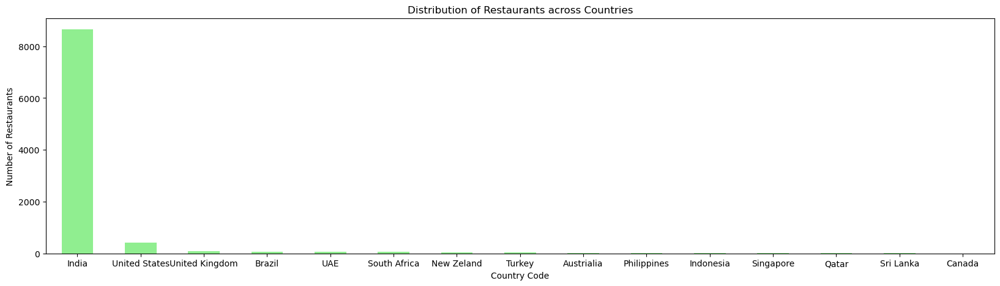

In [34]:
# Plot the distribution of restaurants in each country
plt.figure(figsize=(20, 5))
country_counts.plot(kind='bar', color='lightgreen')
plt.title('Distribution of Restaurants across Countries')
plt.xlabel('Country Code')
plt.ylabel('Number of Restaurants')
plt.xticks(rotation=0)
plt.show()

In [43]:
correlation_longitude_rating = new_df['Longitude'].corr(new_df['Aggregate rating'])
correlation_latitude_rating = new_df['Latitude'].corr(new_df['Aggregate rating'])
print(f"Correlation between Longitude and Aggregate rating: {correlation_longitude_rating}")
print(f"Correlation between Latitude and Aggregate rating: {correlation_latitude_rating}")


Correlation between Longitude and Aggregate rating: -0.11681757734540431
Correlation between Latitude and Aggregate rating: 0.0005155806902360165
